/tmp/ipykernel_2668322/1491238557.py:23: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth, textheight = draw.textsize(bigtext, font)


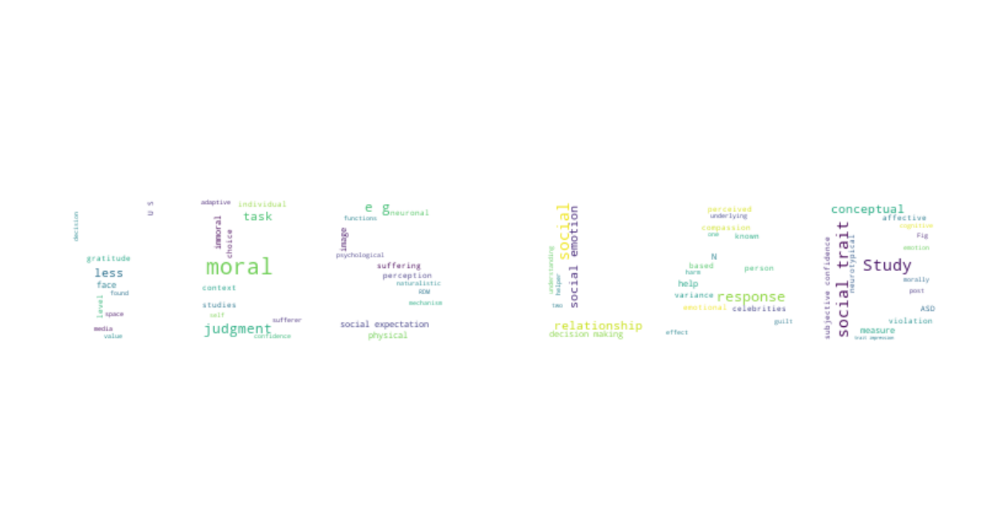

In [23]:

import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image, ImageDraw, ImageFont
# Load the text file
with open('wordcloud.txt', 'r') as file:
    text = file.read()
# delete "participant" or "participants" from the text
text = text.replace("participants", "")
# delete line breaks
text = text.replace("\n", " ")
# Create an image with the text "YES"
width, height = 800, 400
image = Image.new('RGB', (width, height), color='white')
draw = ImageDraw.Draw(image)

# Use a truetype or opentype font file
font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
font = ImageFont.truetype(font_path, 160)

# Draw text in the center
bigtext = "YES LAB"
textwidth, textheight = draw.textsize(bigtext, font)
x = (width - textwidth) / 2
y = (height - textheight) / 2
draw.text((x, y), bigtext, font=font, fill="black")

# # Save the mask image
# mask_path = '/mnt/data/yes_mask.png'
# image.save(mask_path)

# Convert the image to a numpy array
mask = np.array(image)


# Generate the word cloud using the YES mask with better colors
wordcloud = WordCloud(width=1200, height=800, background_color='white', mask=mask, colormap='viridis').generate(text)

# Create the plot
plt.figure(figsize=(16, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

# Save the word cloud image
# wordcloud.to_file('/mnt/data/wordcloud_yes_text_shape_no_border_better_colors.png')

# Show the plot
plt.show()


/tmp/ipykernel_1642025/3528923739.py:19: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
/tmp/ipykernel_1642025/3528923739.py:27: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_lower, textheight_lower = draw.textsize(text_lower, font)


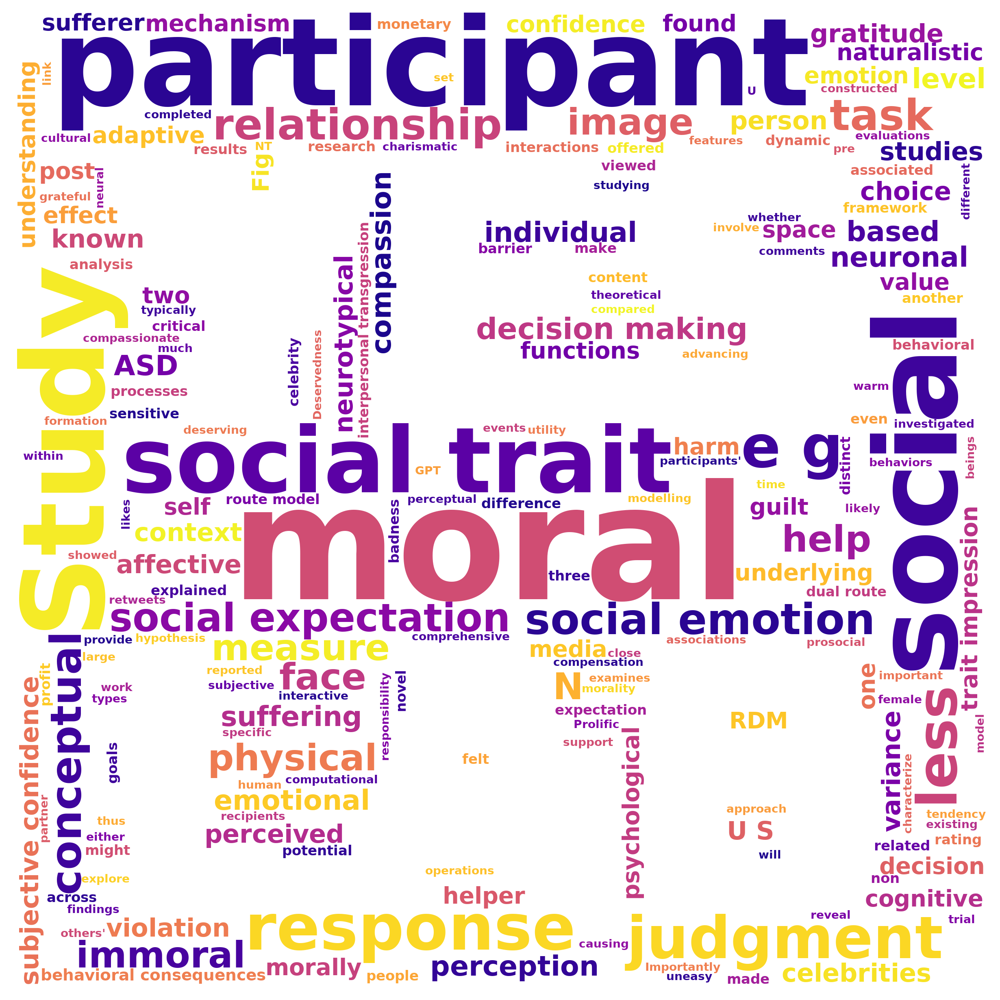

In [3]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image, ImageDraw, ImageFont
with open('wordcloud.txt', 'r') as file:
    text = file.read()

# High-resolution square canvas for mug printing
width, height = 2400, 2400  # 8x8 inches at 300dpi
image = Image.new('RGBA', (width, height), color=(255, 255, 255, 0))  # Transparent background

# Draw bold text mask
font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
font = ImageFont.truetype(font_path, 900)
draw = ImageDraw.Draw(image)

# Draw "YES" in upper half
text_upper = "YES"
textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
x_upper = (width - textwidth_upper) / 2
y_upper = (height // 2 - textheight_upper) / 2
# Use black for mask
draw.text((x_upper, y_upper), text_upper, font=font, fill=(0, 0, 0, 255))

# Draw "LAB" in lower half
text_lower = "LAB"
textwidth_lower, textheight_lower = draw.textsize(text_lower, font)
x_lower = (width - textwidth_lower) / 2
y_lower = (height // 2 + (height // 2 - textheight_lower) / 2)
draw.text((x_lower, y_lower), text_lower, font=font, fill=(0, 0, 0, 255))

# Convert the image to a numpy array for mask
mask = np.array(image)[..., 3]  # Use alpha channel for mask
colormapchoice = "plasma"
# Generate the word cloud with bold, high-contrast colormap and transparent background
wordcloud = WordCloud(
    width=width,
    height=height,
    background_color=None,
    mode="RGBA",
    mask=mask,
    colormap=colormapchoice,  # Bold, high-contrast
    font_path=font_path
).generate(text)

# Create the plot
plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

# Save the word cloud image as PNG with transparency
wordcloud.to_file(f'wordcloud_yes_lab_{colormapchoice}_reverse.png')

plt.show()


In [4]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image, ImageDraw, ImageFont
with open('wordcloud.txt', 'r') as file:
    text = file.read()
# delete 'Fig', 'e.g.' in text
text = text.replace('Fig','').replace('e.g.', '').replace("participants", "")
# delete line breaks
text = text.replace("\n", " ")
# Create an image with the text "YES LAB"
# width, height = 800, 800  # High resolution for printing
# image = Image.new('RGB', (width, height), color='white')
width, height = 2400, 2400  # 8x8 inches at 300dpi
image = Image.new('RGBA', (width, height), color=(255, 255, 255, 0))  # Transparent background

draw = ImageDraw.Draw(image)

# Use a truetype or opentype font file
font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
font = ImageFont.truetype(font_path, 350)

# Draw "YES" text in the upper part
text_upper = "YES"
textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
x_upper = (width - textwidth_upper) / 2
y_upper = (height / 2 - textheight_upper) / 2
draw.text((x_upper, y_upper), text_upper, font=font, fill=(0, 0, 0, 255))

# Draw "LAB" text in the lower part
text_lower = "LAB"
textwidth_lower, textheight_lower = draw.textsize(text_lower, font)
x_lower = (width - textwidth_lower) / 2
y_lower = (height / 2 + (height / 2 - textheight_lower) / 2)
draw.text((x_lower, y_lower), text_lower, font=font, fill=(0, 0, 0, 255))

# Convert the image to a numpy array
mask = np.array(image)


# suggest a colormap choice
# colormapchoice = "ocean"  # Change this to your desired colormap choice
# colormapchoice = "viridis"  # Change this to your desired colormap choice
colormapchoice = "tab10"  # Change this to your desired colormap choice
# colormapchoice = "RdBu"  # Change this to your desired colormap choice
# colormapchoice = "plasma"  # Change this to your desired colormap choice
# colormapchoice = "magma"  # Change this to your desired colormap choice

# Generate the word cloud using the YES LAB mask with better colors
# wordcloud = WordCloud(width=2400, height=2400, background_color='white', mask=mask, colormap="jet", font_path=font_path).generate(text)
wordcloud = WordCloud(
    width=width,
    height=height,
    background_color=None,
    mode="RGBA",
    mask=mask,
    colormap=colormapchoice,  # Bold, high-contrast
    font_path=font_path,
    min_font_size=7,  # increase min_font_size to avoid tiny unreadable text
    max_words=150,  # Limit the number of words to avoid clutter
).generate(text)

# Create the plot
plt.figure(figsize=(8,8),dpi = 1000)
plt.imshow(wordcloud, interpolation='bilinear')

plt.tight_layout(pad=0)
plt.axis('off')

# Save the word cloud image in high quality
wordcloud.to_file(f'wordcloud_yes_lab_{colormapchoice}.png',)
# save it to PDF
plt.savefig(f'wordcloud_yes_lab_plt_{colormapchoice}.pdf', format="pdf", dpi=1000, bbox_inches="tight")


# Show the plot
plt.show()

/tmp/ipykernel_2794701/4259618239.py:25: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
/tmp/ipykernel_2794701/4259618239.py:32: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_lower, textheight_lower = draw.textsize(text_lower, font)


In [8]:

# High-resolution square canvas for mug printing
width, height = 2400, 2400  # 8x8 inches at 300dpi
image = Image.new('RGBA', (width, height), color=(255, 255, 255, 0))  # Transparent background

# Font for "YES LAB"
font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
font = ImageFont.truetype(font_path, 900)
draw = ImageDraw.Draw(image)

# Draw "YES" in upper half
text_upper = "YES"
textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
x_upper = (width - textwidth_upper) / 2
y_upper = (height // 2 - textheight_upper) / 2
draw.text((x_upper, y_upper), text_upper, font=font, fill=(0, 0, 0, 255))  # black text full alpha

# Draw "LAB" in lower half
text_lower = "LAB"
textwidth_lower, textheight_lower = draw.textsize(text_lower, font)
x_lower = (width - textwidth_lower) / 2
y_lower = (height // 2 + (height // 2 - textheight_lower) / 2)
draw.text((x_lower, y_lower), text_lower, font=font, fill=(0, 0, 0, 255))

# Get alpha channel from RGBA
alpha_channel = np.array(image)[..., 3]

# Invert alpha to make letters empty space and rest fillable
mask = np.where(alpha_channel > 0, 0, 255).astype(np.uint8)

# Colormap choice
colormapchoice = "tab10"

# Create the word cloud
wordcloud = WordCloud(
    width=width,
    height=height,
    background_color=None,  # Transparent
    mode="RGBA",            # Keep alpha channel
    mask=mask,
    colormap=colormapchoice,
    font_path=font_path,
    min_font_size=8,       # Prevent tiny words
    max_words=150
).generate(text)

# Plot preview
fig=plt.figure(figsize=(8, 8), dpi=2000)
ax=fig.add_axes([0, 0, 1, 1])
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis('off')
plt.tight_layout(pad=0)

# Save PNG with transparency
wordcloud.to_file(f'wordcloud_yes_lab_{colormapchoice}_letters_empty.png')
# save it to PDF
fig.savefig(f'wordcloud_yes_lab_plt_{colormapchoice}.pdf', format="pdf", dpi=2000, pad_inches=0,bbox_inches="tight",transparent=True)

plt.show()

/tmp/ipykernel_2794701/2259917006.py:12: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
/tmp/ipykernel_2794701/2259917006.py:19: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_lower, textheight_lower = draw.textsize(text_lower, font)
/tmp/ipykernel_2794701/2259917006.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0)


/tmp/ipykernel_1642025/1688064634.py:12: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
/tmp/ipykernel_1642025/1688064634.py:19: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  textwidth_lower, textheight_lower = draw.textsize(text_lower, font)


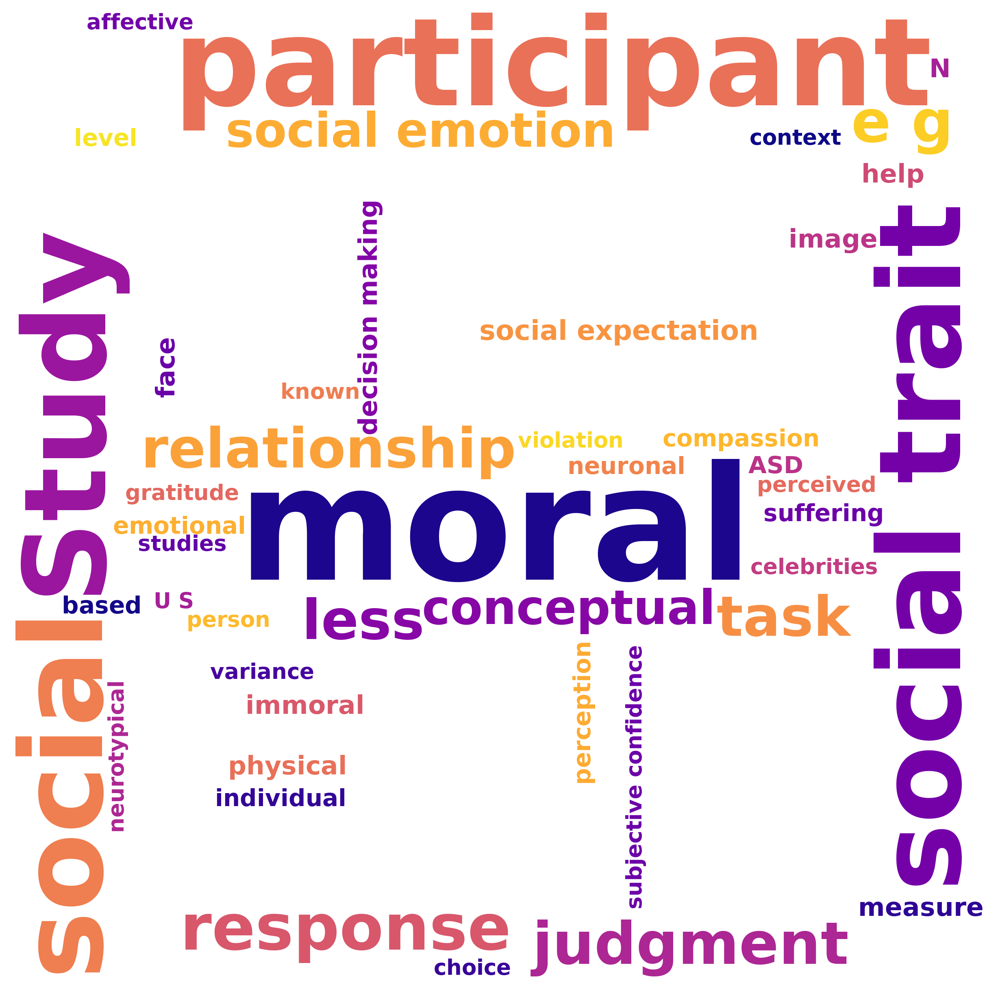

In [ ]:

# High-resolution square canvas for mug printing
width, height = 2400, 2400  # 8x8 inches at 300dpi
image = Image.new('RGBA', (width, height), color=(255, 255, 255, 0))  # Transparent background

# Font for "YES LAB"
font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
font = ImageFont.truetype(font_path, 900)
draw = ImageDraw.Draw(image)

# Draw "YES" in upper half
text_upper = "YES"
textwidth_upper, textheight_upper = draw.textsize(text_upper, font)
x_upper = (width - textwidth_upper) / 2
y_upper = (height // 2 - textheight_upper) / 2
draw.text((x_upper, y_upper), text_upper, font=font, fill=(0, 0, 0, 255))  # black text, full alpha

# Draw "LAB" in lower half
text_lower = "LAB"
textwidth_lower, textheight_lower = draw.textsize(text_lower, font)
x_lower = (width - textwidth_lower) / 2
y_lower = (height // 2 + (height // 2 - textheight_lower) / 2)
draw.text((x_lower, y_lower), text_lower, font=font, fill=(0, 0, 0, 255))

# Use alpha channel as mask
mask = np.array(image)[..., 3]  # Only alpha channel

# Colormap choice
colormapchoice = "plasma"

# Create the word cloud
wordcloud = WordCloud(
    width=width,
    height=height,
    background_color=None,  # Transparent
    mode="RGBA",            # Keep alpha channel
    mask=mask,
    colormap=colormapchoice,
    font_path=font_path,
    min_font_size=50,       # Prevent tiny words (good for printing)
    max_words=150           # Optional: fewer words = larger sizes
).generate(text)

# Plot preview
plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

# Save PNG with transparency
wordcloud.to_file(f'wordcloud_yes_lab_{colormapchoice}_transparent.png')

plt.show()


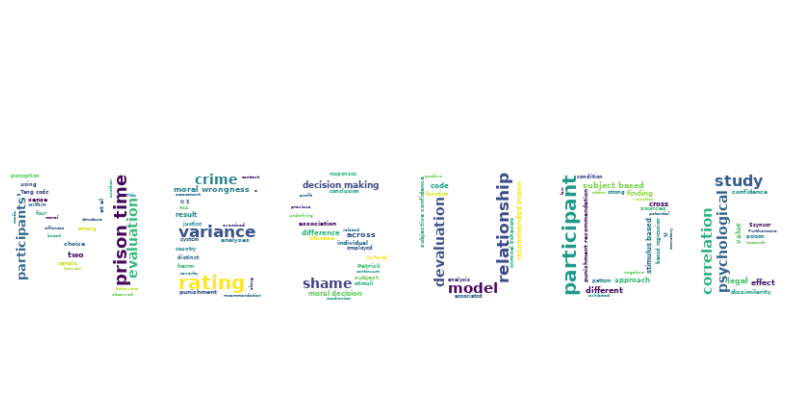

In [ ]:

import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image, ImageDraw, ImageFont

# Create an image with the text "YES"
width, height = 800, 400
image = Image.new('RGB', (width, height), color='white')
draw = ImageDraw.Draw(image)

# Use a truetype or opentype font file
font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
font = ImageFont.truetype(font_path, 180)

# Draw text in the center
text = "MESUDE"
textbbox = draw.textbbox((0, 0), text, font=font)
textwidth, textheight = textbbox[2] - textbbox[0], textbbox[3] - textbbox[1]
x = (width - textwidth) / 2
y = (height - textheight) / 2
draw.text((x, y), text, font=font, fill="black")

# Save the mask image
mask_path = '/mnt/data/yes_mask.png'
# image.save(mask_path)

# Convert the image to a numpy array
mask = np.array(image)

# Provided text
# Generate the word cloud using the YES mask with better colors and bold font
wordcloud = WordCloud(width=800, height=400, background_color='white', mask=mask, colormap='viridis', font_path=font_path).generate(text)

# Create the plot
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

# Save the word cloud image
# wordcloud.to_file('/mnt/data/wordcloud_yes_text_shape_no_border_bold.png')

# Show the plot
plt.show()

In [24]:
text
# how many times does the word " n " appear in the text?

s_count = text.count(" s ")
s_count

0